<a href="https://www.kaggle.com/code/sc0v1n0/explore-kerastuner-transport-classification?scriptVersionId=196786262" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

# Settings Environment

In [1]:
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  print('Not Found GPU at: {}'.format(device_name))
else:
    print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


In [2]:
# Python
import pathlib
import os
import shutil
import tarfile

# External
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import PIL
import cv2

# TF
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

In [3]:
import pandas as pd
import os

def set_seed(seed=123456):
    np.random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)

SEED = 123456
set_seed(SEED)

pd.set_option('display.max_columns', 30)

In [4]:
!pip install keras-tuner --upgrade

/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


-----------

# PARAMS

In [5]:
PARAMS = {
    # PATHS
    'PATH': '/kaggle/input',

    # Datasets Images
    'DS_IMAGES': 'transport',

    # DIRECTORY
    'DIRECTORY_SPLIT' : 0.2,
    'DIRECTORY_SEED': 123456,
    'DIRECTORY_IMAGE_SIZE': 512,
    'DIRECTORY_BATCH_SIZE': 32,
    'DIRECTORY_SHUFFLE': 1000,

    # AUGMENTATION
    'AUGMENTATION_RANDOM_FLIP': 'horizontal',
    'AUGMENTATION_RANDOM_ROTATION':0.2,
    'AUGMENTATION_RANDOM_ZOOM':0.2,
    'AUGMENTATION_RESCALING': 1./255,
    'AUGMENTATION_RANDOM_CONTRAST_FACTOR':0.1,
    'AUGMENTATION_RANDOM_TRANSLATION_HEIGHT_FACTOR':0.1,
    'AUGMENTATION_RANDOM_TRANSLATION_WIDTH_FACTOR':0.1,
    'AUGMENTATION_RANDOM_TRANSLATION_FILL_MODE':'reflect',
    'AUGMENTATION_RANDOM_TRANSLATION_INTERPOLATION':'bilinear',

    # CALLBACK

    'CALLBACK_MONITOR': 'val_accuracy',
    'CALLBACK_PATIENCE': 50,
    'CALLBACK_MIN_DELTA': 0.001,
    'CALLBACK_RESTORE_BEST_WEIGHTS': True,

    # MODEL

    'MODEL_DROPOUT': .5,
    'MODEL_N_CLASSES': 4,
    'MODEL_KERAS_IMAGE_SIZE': (512, 512, 3),
    'MODEL_SOFTMAX_AXIS': -1,
    'MODEL_COMPILER_METRICS': ['accuracy'],
    'MODEL_EPOCHS': 100,  #1000 #100 #50
    'MODEL_FROM_LOGITS': False,
    'MODEL_LEARNING_RATE': 0.001,

    # KerasTuner

    'HP_EPOCHS': 10,  #1000 #100 #50
    
}

----------

# Dataset

In [6]:
data_dir_train = pathlib.Path(os.path.join(PARAMS['PATH'], PARAMS['DS_IMAGES']), 'train').with_suffix('')
data_dir_valid = pathlib.Path(os.path.join(PARAMS['PATH'], PARAMS['DS_IMAGES']), 'valid').with_suffix('')
print(data_dir_train)
print(data_dir_valid)

/kaggle/input/transport/train
/kaggle/input/transport/valid


In [7]:
train_ds = tf.keras.utils.image_dataset_from_directory(
          data_dir_train,
          #validation_split=PARAMS['DIRECTORY_SPLIT'],
          #subset="training",
          seed=PARAMS['DIRECTORY_SEED'],
          image_size=(PARAMS['DIRECTORY_IMAGE_SIZE'], PARAMS['DIRECTORY_IMAGE_SIZE']),
          batch_size=PARAMS['DIRECTORY_BATCH_SIZE'],
          )

Found 524 files belonging to 4 classes.


In [8]:
val_ds = tf.keras.utils.image_dataset_from_directory(
        data_dir_valid,
        #validation_split=PARAMS['DIRECTORY_SPLIT'],
        #subset="validation",
        seed=PARAMS['DIRECTORY_SEED'],
        image_size=(PARAMS['DIRECTORY_IMAGE_SIZE'], PARAMS['DIRECTORY_IMAGE_SIZE']),
        batch_size=PARAMS['DIRECTORY_BATCH_SIZE'],
        )

Found 128 files belonging to 4 classes.


In [9]:
train_ds = tf.keras.utils.image_dataset_from_directory(
          data_dir_train,
          #validation_split=PARAMS['DIRECTORY_SPLIT'],
          #subset="training",
          seed=PARAMS['DIRECTORY_SEED'],
          image_size=(PARAMS['DIRECTORY_IMAGE_SIZE'], PARAMS['DIRECTORY_IMAGE_SIZE']),
          batch_size=PARAMS['DIRECTORY_BATCH_SIZE'],
          )

Found 524 files belonging to 4 classes.


In [10]:
def log_directory(dataset_images, names):
  for dts, name in zip(dataset_images, names):

      length = 100
      print('-' * length)
      class_names = dts.class_names
      r_dict = {key: [] for key in class_names + ['total_images', 'total_labels']}

      print(f"\n{name:^{length}}\n")

      for images, labels in dts:

        r_dict['total_images'].append(len(images))
        r_dict['total_labels'].append(len(labels))

        lbs = labels.numpy().tolist()

        df = pd.DataFrame({'class': lbs})

        for n in np.unique(lbs):
          idxs = list(df[df['class'] == n].index)
          images_filter = len(tf.gather(images, idxs).numpy())
          r_dict[class_names[n]].append(images_filter)

      for k, v in r_dict.items():
        r_dict[k] =  np.sum(v)

      for key,value in r_dict.items():
	      print(key, ':', value)

In [11]:
log_directory([train_ds, val_ds], ['train', 'valid'])

----------------------------------------------------------------------------------------------------

                                               train                                                

airplane : 136
boat : 116
bus : 135
train : 137
total_images : 524
total_labels : 524
----------------------------------------------------------------------------------------------------

                                               valid                                                

airplane : 33
boat : 28
bus : 33
train : 34
total_images : 128
total_labels : 128


In [12]:
class_names_train = train_ds.class_names
class_names_val_ds = val_ds.class_names

In [13]:
print(class_names_train, class_names_val_ds)

['airplane', 'boat', 'bus', 'train'] ['airplane', 'boat', 'bus', 'train']


In [14]:
class_names_global = ['airplane', 'boat', 'bus', 'train']

print(class_names_global)

['airplane', 'boat', 'bus', 'train']


-------

# Preview Images

In [15]:
def preview_images(dataset, size):
    class_names = dataset.class_names
    plt.figure(figsize=(size, size))
    for images, labels in dataset.take(1):
      for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")

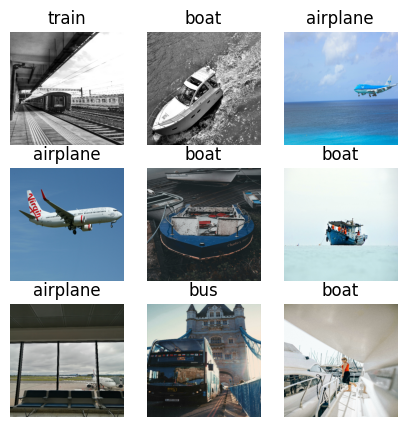

In [16]:
preview_images(train_ds, 5)

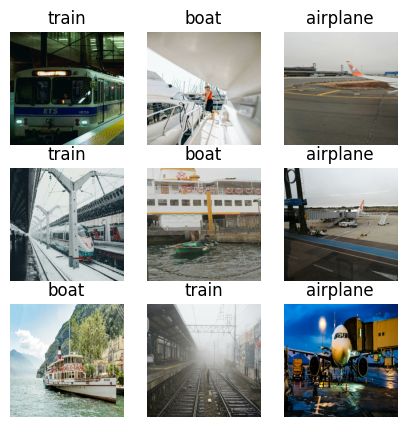

In [17]:
preview_images(train_ds, 5)

--------

# KerasTuner

Learning by documentation >> [KerasTuner](https://keras.io/keras_tuner/)

In [18]:
import keras_tuner
import keras

In [19]:
def build_model(hp):


    AUGMENTATION = keras.Sequential(
      [
        layers.RandomFlip(
            PARAMS['AUGMENTATION_RANDOM_FLIP']
        ),
        layers.RandomRotation(
            PARAMS['AUGMENTATION_RANDOM_ROTATION']
        ),
        layers.RandomZoom(
            PARAMS['AUGMENTATION_RANDOM_ZOOM']
        ),
        layers.Rescaling(
            PARAMS['AUGMENTATION_RESCALING']
        ),
        layers.RandomContrast(
            factor=PARAMS['AUGMENTATION_RANDOM_CONTRAST_FACTOR'],
            seed=PARAMS['DIRECTORY_SEED']
        ),
        layers.RandomTranslation(
            height_factor=PARAMS['AUGMENTATION_RANDOM_TRANSLATION_HEIGHT_FACTOR'],
            width_factor=PARAMS['AUGMENTATION_RANDOM_TRANSLATION_WIDTH_FACTOR'],
            fill_mode=PARAMS['AUGMENTATION_RANDOM_TRANSLATION_FILL_MODE'],
            interpolation=PARAMS['AUGMENTATION_RANDOM_TRANSLATION_INTERPOLATION'],
            seed=PARAMS['DIRECTORY_SEED'],
        ),
      ]
    )
    
    hp_activation = hp.Choice("activation", ["relu", "tanh"])
    model = Sequential([
      keras.Input(shape=PARAMS['MODEL_KERAS_IMAGE_SIZE']),
      AUGMENTATION,
      layers.Conv2D(12, 3, padding='same', activation=hp_activation),
      layers.MaxPooling2D(),
      layers.Dropout((PARAMS['MODEL_DROPOUT'] - .2)),
      layers.Conv2D(24, 3, padding='same', activation=hp_activation),
      layers.MaxPooling2D(),
      layers.Dropout((PARAMS['MODEL_DROPOUT'] - .1)),
      layers.Conv2D(64, 3, padding='same', activation=hp_activation),
      layers.MaxPooling2D(),
      layers.Dropout((PARAMS['MODEL_DROPOUT'] - .2)),
      layers.Conv2D(84, 3, padding='same', activation=hp_activation),
      layers.MaxPooling2D(),
      layers.Dropout((PARAMS['MODEL_DROPOUT'] - .2)),
      layers.Conv2D(112, 3, padding='same', activation=hp_activation),
      layers.MaxPooling2D(),
      layers.Dropout((PARAMS['MODEL_DROPOUT'] - .1)),
      layers.Flatten(),
      layers.Dense(units=hp.Int(f"units_hp", min_value=32, max_value=512, step=32), activation=hp_activation),
      layers.Dense(len(class_names_global), activation=None, name="outputs"),
      layers.Softmax(axis=PARAMS['MODEL_SOFTMAX_AXIS']),
    ])
    
    learning_rate = hp.Float("lr", min_value=1e-4, max_value=1e-2, sampling="log")
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
        loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=PARAMS['MODEL_FROM_LOGITS']),
        metrics=PARAMS['MODEL_COMPILER_METRICS'],
    )
    return model

In [20]:
tuner = keras_tuner.RandomSearch(
    hypermodel=build_model,
    objective='val_loss',
    max_trials=3,
    executions_per_trial=2,
)

In [21]:
tuner.search_space_summary()

Search space summary
Default search space size: 3
activation (Choice)
{'default': 'relu', 'conditions': [], 'values': ['relu', 'tanh'], 'ordered': False}
units_hp (Int)
{'default': None, 'conditions': [], 'min_value': 32, 'max_value': 512, 'step': 32, 'sampling': 'linear'}
lr (Float)
{'default': 0.0001, 'conditions': [], 'min_value': 0.0001, 'max_value': 0.01, 'step': None, 'sampling': 'log'}


In [22]:
tuner.search(train_ds, epochs=PARAMS['HP_EPOCHS'], validation_data=val_ds)

Trial 3 Complete [00h 12m 32s]
val_loss: 1.259002685546875

Best val_loss So Far: 1.259002685546875
Total elapsed time: 00h 37m 39s


In [23]:
tuner.get_best_models()

/opt/conda/lib/python3.10/site-packages/keras/src/saving/saving_lib.py:415: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


[<Sequential name=sequential_1, built=True>]

In [24]:
best_model = tuner.get_best_models()[0]

In [25]:
best_model

<Sequential name=sequential_1, built=True>

In [26]:
best_model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential (Sequential)         │ (None, 512, 512, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 512, 512, 12)   │           336 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 256, 256, 12)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256, 256, 12)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 256, 256, 24)   │         2,616 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 128, 128, 24)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128, 128, 24)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 128, 128, 64)   │        13,888 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 64, 64, 84)     │        48,468 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 32, 32, 84)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 32, 32, 84)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 32, 32, 112)    │        84,784 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 16, 16, 112)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 16, 16, 112)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 28672)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 352)            │    10,092,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ outputs (Dense)                 │ (None, 4)              │         1,412 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ softmax (Softmax)               │ (None, 4)              │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 10,244,400 (39.08 MB)

 Trainable params: 10,244,400 (39.08 MB)

 Non-trainable params: 0 (0.00 B)

In [27]:
tuner.results_summary()

Results summary
Results in ./untitled_project
Showing 10 best trials
Objective(name="val_loss", direction="min")

Trial 2 summary
Hyperparameters:
activation: tanh
units_hp: 352
lr: 0.00043122634871936203
Score: 1.259002685546875

Trial 1 summary
Hyperparameters:
activation: tanh
units_hp: 288
lr: 0.0006325254884851999
Score: 1.293619692325592

Trial 0 summary
Hyperparameters:
activation: relu
units_hp: 512
lr: 0.0001397346504205904
Score: 1.3128776550292969


-----------

# Evaluation

In [28]:
import random
from PIL import Image

In [29]:
def prediction_img(image, model):

    img_ = tf.convert_to_tensor([image])

    prediction = model.predict(img_)
    prediction = list(tf.argmax(prediction, axis=1).numpy())
    name_class = [class_names_global[x] for x in prediction]

    return name_class[0]


In [30]:
def preview_images(dataset, w, h, model):
    class_names = class_names_global
    plt.figure(figsize=(w, h))
    for images, labels in dataset.take(1):
        for i in range(15):
            ax = plt.subplot(5, 5, i + 1)
            y_one_pred = prediction_img(images[i], model) 
            plt.imshow(images[i].numpy().astype("uint8"))
            if class_names[labels[i]] == y_one_pred:
                plt.title(f'y_true: {class_names[labels[i]]} \n y_pred: {y_one_pred}', c='green', fontsize=18)
            else:
                plt.title(f'y_true: {class_names[labels[i]]} \n y_pred: {y_one_pred}', c='red', fontsize=18)
            plt.axis("off")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


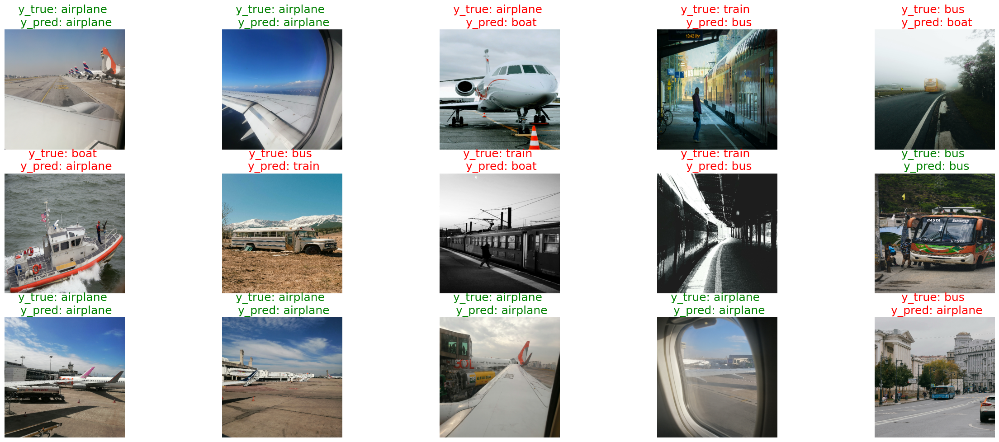

In [31]:
preview_images(train_ds, 30, 20, best_model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


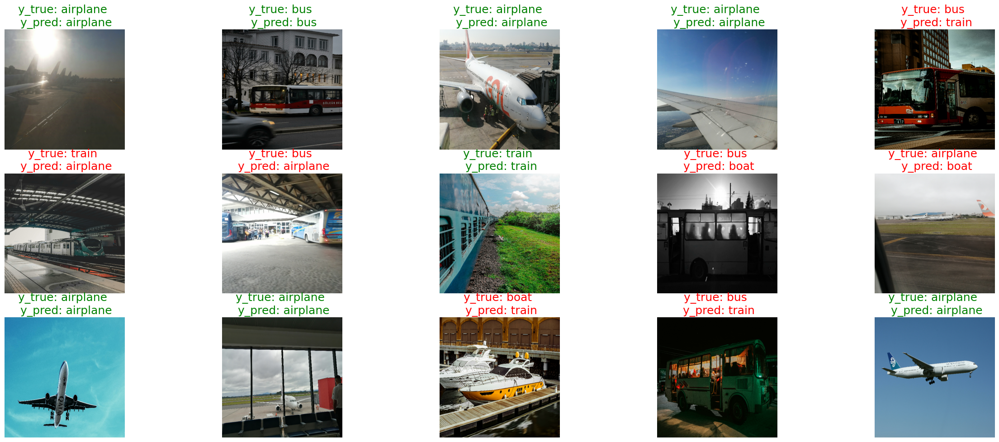

In [32]:
preview_images(val_ds, 30, 20, best_model)

In [33]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

def plot_confusion_matrix(y_true, y_pred, dataset):
    norms = [None, 'all', 'true', 'pred']
    fig, ax = plt.subplots(1, len(norms), figsize=(24, 6))
    for idx, norm in enumerate(norms):
        ConfusionMatrixDisplay.from_predictions(y_true,
                                                y_pred,
                                                labels=np.arange(len(class_names_global)),
                                                normalize=norm,
                                                display_labels=class_names_global,
                                                colorbar=False,
                                                ax=ax[idx],
                                                cmap='Blues')
        ax[idx].set_title(f'Norm={norm}')

In [34]:
def return_y_true_and_pred(dataset, model):
  labels = []
  for img, label in dataset:
    labels.append(label)
  y_true =  list(tf.concat(labels, axis=0).numpy())
  pred = model.predict(dataset)
  pred = np.argmax(pred, axis=1)
  assert len(y_true) == len(pred)
  return y_true, pred

17/17 ━━━━━━━━━━━━━━━━━━━━ 29s 2s/step


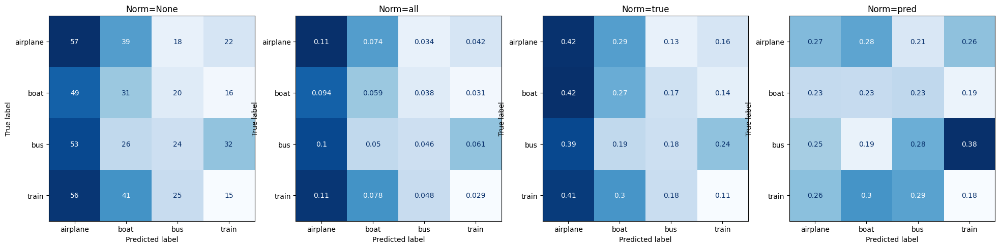

In [35]:
train_y_true, train_pred = return_y_true_and_pred(train_ds, best_model)
plot_confusion_matrix(train_y_true, train_pred, train_ds)

4/4 ━━━━━━━━━━━━━━━━━━━━ 7s 2s/step


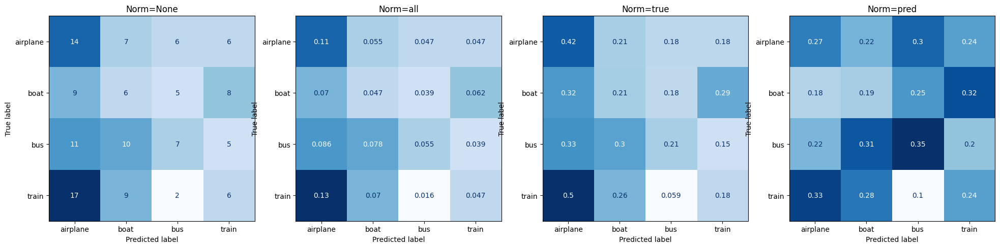

In [36]:
val_y_true, val_pred = return_y_true_and_pred(val_ds, best_model)
plot_confusion_matrix(val_y_true, val_pred, val_ds)

In [37]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import ConfusionMatrixDisplay

In [38]:
from sklearn.metrics import accuracy_score, confusion_matrix, recall_score, precision_score, f1_score

def full_evaluation(group_y_true: list, group_preds: list):
    df_model_evaluation = {
        'accuracy_score': [],
        'recall_score': [],
        'f1_score': [],
        'precision_score': [],
    }
    idx = ['train_metrics', 'val_metrics']
    for y_true, preds in zip(group_y_true, group_preds):
        df_model_evaluation['accuracy_score'].append(accuracy_score(y_true, preds))  
        df_model_evaluation['recall_score'].append(recall_score(y_true, preds, average='micro'))  
        df_model_evaluation['f1_score'].append(f1_score(y_true, preds, average='micro'))
        df_model_evaluation['precision_score'].append(precision_score(y_true, preds, average='micro'))

    ds = pd.DataFrame(index=idx, data=df_model_evaluation)    
    return ds

In [39]:
eval_ds = full_evaluation([train_y_true, val_y_true], [train_pred, val_pred])
eval_ds

,accuracy_score,recall_score,f1_score,precision_score
train_metrics,0.242366,0.242366,0.242366,0.242366
val_metrics,0.257812,0.257812,0.257812,0.257812


------

# Retrain the model

In [40]:
best_hp = tuner.get_best_hyperparameters()[0]

In [41]:
best_hp

In [42]:
re_best_model = build_model(best_hp)
re_best_model.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential_2 (Sequential)       │ (None, 512, 512, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 512, 512, 12)   │           336 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 256, 256, 12)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 256, 256, 12)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 256, 256, 24)   │         2,616 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 128, 128, 24)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 128, 128, 24)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 128, 128, 64)   │        13,888 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 64, 64, 84)     │        48,468 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 32, 32, 84)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 32, 32, 84)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 32, 32, 112)    │        84,784 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 16, 16, 112)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 16, 16, 112)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 28672)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 352)            │    10,092,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ outputs (Dense)                 │ (None, 4)              │         1,412 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ softmax_1 (Softmax)             │ (None, 4)              │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 10,244,400 (39.08 MB)

 Trainable params: 10,244,400 (39.08 MB)

 Non-trainable params: 0 (0.00 B)

In [43]:
callbacks = [
    tf.keras.callbacks.EarlyStopping(
        monitor=PARAMS['CALLBACK_MONITOR'],
        patience=PARAMS['CALLBACK_PATIENCE'],
        min_delta=PARAMS['CALLBACK_MIN_DELTA'],
        restore_best_weights=PARAMS['CALLBACK_RESTORE_BEST_WEIGHTS'],
    ),
    tf
    .keras
    .callbacks
    .ModelCheckpoint(
        filepath='/kaggle/working/re_best_model.keras',
        monitor='val_accuracy',
        save_best_only=True,
        mode='max',
        verbose=1
        ),
]

In [44]:
history = re_best_model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=PARAMS['MODEL_EPOCHS'],
  callbacks=[callbacks],
)

Epoch 1/100


2024-09-15 18:38:15.735245: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/sequential_3_1/dropout_5_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.2116 - loss: 6.3002
Epoch 1: val_accuracy improved from -inf to 0.25781, saving model to /kaggle/working/re_best_model.keras
17/17 ━━━━━━━━━━━━━━━━━━━━ 40s 2s/step - accuracy: 0.2123 - loss: 6.3105 - val_accuracy: 0.2578 - val_loss: 1.8493
Epoch 2/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.2819 - loss: 1.9266
Epoch 2: val_accuracy improved from 0.25781 to 0.33594, saving model to /kaggle/working/re_best_model.keras
17/17 ━━━━━━━━━━━━━━━━━━━━ 37s 2s/step - accuracy: 0.2817 - loss: 1.9100 - val_accuracy: 0.3359 - val_loss: 1.3680
Epoch 3/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.2499 - loss: 1.4026
Epoch 3: val_accuracy improved from 0.33594 to 0.43750, saving model to /kaggle/working/re_best_model.keras
17/17 ━━━━━━━━━━━━━━━━━━━━ 38s 2s/step - accuracy: 0.2514 - loss: 1.4020 - val_accuracy: 0.4375 - val_loss: 1.3145
Epoch 4/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.2574 - loss: 1.3766
Epoch 4: v

---------

# Evaluation 2

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


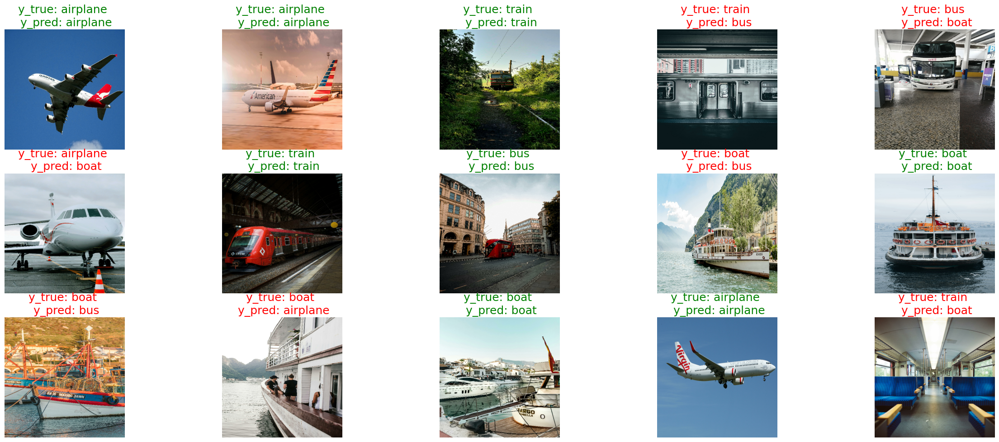

In [45]:
preview_images(train_ds, 30, 20, best_model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


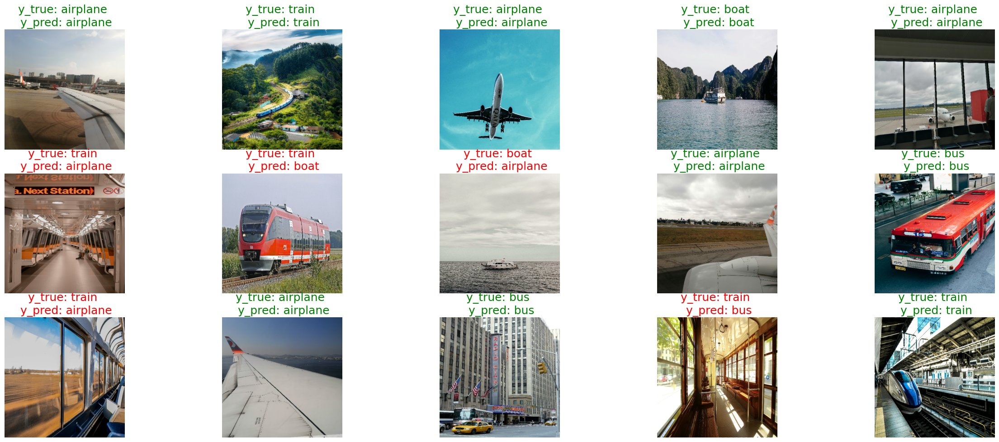

In [46]:
preview_images(val_ds, 30, 20, best_model)

17/17 ━━━━━━━━━━━━━━━━━━━━ 29s 2s/step


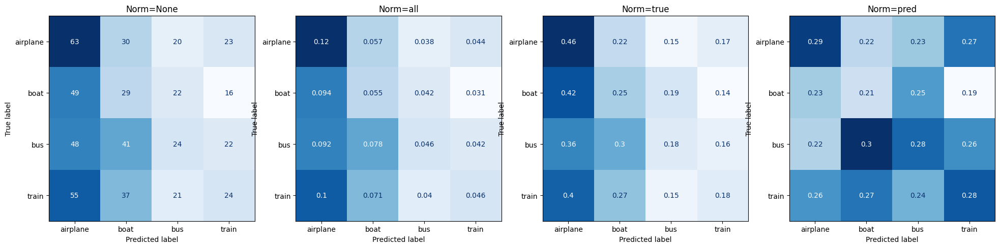

In [47]:
train_y_true, train_pred = return_y_true_and_pred(train_ds, best_model)
plot_confusion_matrix(train_y_true, train_pred, train_ds)

4/4 ━━━━━━━━━━━━━━━━━━━━ 7s 2s/step


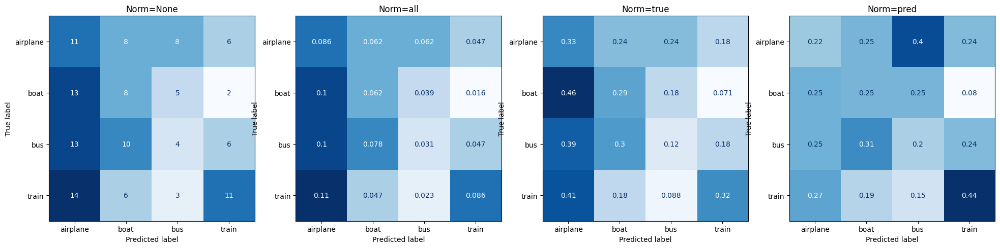

In [48]:
val_y_true, val_pred = return_y_true_and_pred(val_ds, best_model)
plot_confusion_matrix(val_y_true, val_pred, val_ds)

In [49]:
eval_ds = full_evaluation([train_y_true, val_y_true], [train_pred, val_pred])
eval_ds

,accuracy_score,recall_score,f1_score,precision_score
train_metrics,0.267176,0.267176,0.267176,0.267176
val_metrics,0.265625,0.265625,0.265625,0.265625
